<a href="https://colab.research.google.com/github/NickTimosh/KPMG_project/blob/main/Notebook/kpmg_internship.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0. Import modules and data

In [1]:
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from datetime import datetime, date
from matplotlib.ticker import ScalarFormatter

In [2]:
# Exploring Excel workbook
file_path = '/content/drive/MyDrive/Colab Notebooks/KPMG/kpmg_data.xlsx'
sheet_names = pd.ExcelFile(file_path).sheet_names[1:]
sheet_names

['Transactions', 'NewCustomerList', 'CustomerDemographic', 'CustomerAddress']

In [3]:
# Data import
df_transactions = pd.read_excel(file_path, sheet_name='Transactions', header=1)
df_newcustomers = pd.read_excel(file_path, sheet_name='NewCustomerList', header=1)
df_demographic= pd.read_excel(file_path, sheet_name='CustomerDemographic', header=1)
df_address= pd.read_excel(file_path, sheet_name='CustomerAddress', header=1)

<ipython-input-3-a898063a9941>:3: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  df_newcustomers = pd.read_excel(file_path, sheet_name='NewCustomerList', header=1)
<ipython-input-3-a898063a9941>:4: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  df_demographic= pd.read_excel(file_path, sheet_name='CustomerDemographic', header=1)


# 1. Data Profiling

In [ ]:
!pip install pandas_profiling
import ydata_profiling as dp

Done to assess datasets for their uniqueness, consostency, logic and to understand how it`s gonna work with available data.

In [14]:
print(dir(dp))

['ProfileReport', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', 'compare', 'compare_reports', 'config', 'controller', 'expectations_report', 'importlib', 'model', 'pandas_decorator', 'profile_report', 'report', 'serialize_report', 'spec', 'utils', 'version', 'visualisation', 'ydata_profiling']


In [ ]:
dp.ProfileReport(df_transactions, title="Transactions Profiling Report")

Transactions table contained 20,000 records providing information on transactions made by 3,494 distinct customers for 101 distinct products and 6 brands from the year 2017. No duplicate transactions were found. This will be the main dataset to assess profit, product and brand distribution.

In [ ]:
dp.ProfileReport(df_newcustomers, title="New Customers Profiling Report")

NewCustomers table expanded CustomerDemographic data with 1,000 new customers. The dataset can be used to futher comparison with old customers profiles

In [ ]:
dp.ProfileReport(df_demographic, title="Demographic Profiling Report")

CustomerDemographic table represents data related to 4,000 customers indicating names, genders, birthdates, job titles and other information. The information related to car owning, wealth segment, number of purchases and other fields, can be used for further customer segmentation.

In [ ]:
dp.ProfileReport(df_address, title="Address Profiling Report")

CustomerAddress table provides data related to addresses, postcodes, states and countries for 3,999 customers referring to customer_id as foreign key.

# 2. Data Quality Assessment

## 2.1. Transactions

In [46]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   transaction_id           20000 non-null  int64         
 1   product_id               20000 non-null  int64         
 2   customer_id              20000 non-null  int64         
 3   transaction_date         20000 non-null  datetime64[ns]
 4   online_order             19640 non-null  float64       
 5   order_status             20000 non-null  object        
 6   brand                    19803 non-null  object        
 7   product_line             19803 non-null  object        
 8   product_class            19803 non-null  object        
 9   product_size             19803 non-null  object        
 10  list_price               20000 non-null  float64       
 11  standard_cost            19803 non-null  float64       
 12  product_first_sold_date  19803 n

What`s needed to be performed:
* the product_first_sold date represented by numbers instead of dates
* blank values

In [47]:
# changing datatype for the column
df_transactions_clean = df_transactions.copy()
df_transactions_clean['product_first_sold_date_clean'] = pd.to_datetime(df_transactions_clean['product_first_sold_date'],unit='D', origin='1899-12-30')
df_transactions_clean.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_first_sold_date_clean
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,2012-12-02
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,2014-03-03
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,1999-07-20
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,1998-12-16
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,2015-08-10


<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

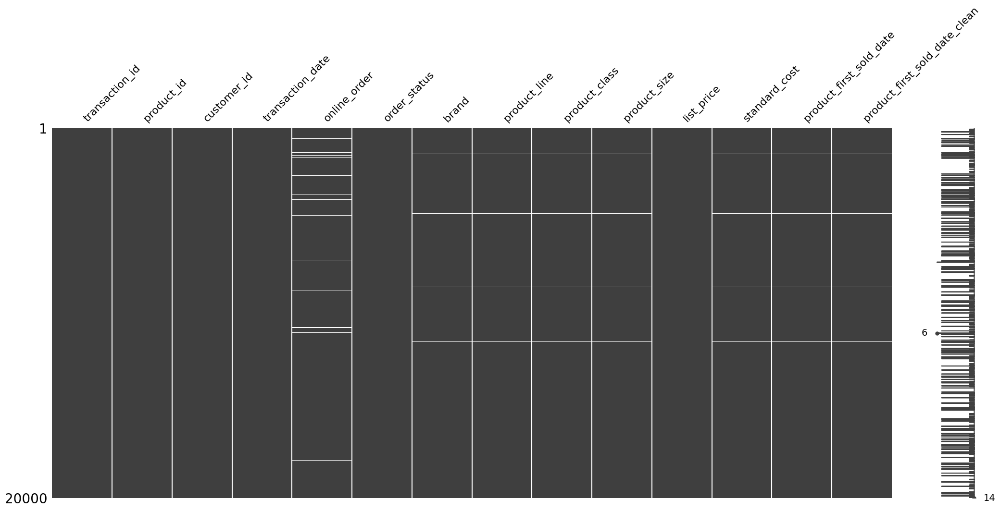

In [48]:
msno.matrix(df_transactions_clean.sort_values(by=['transaction_date']))
plt.plot

Removed 197 records where there is no any data on ['brand', 'product_line', 'product_class', 'standard_cost']

In [49]:
df_transactions_clean['brand'].isna().sum()

197

In [50]:
df_transactions_clean = df_transactions_clean.dropna(subset = ['brand'])

In [51]:
df_transactions_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19803 entries, 0 to 19999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   transaction_id                 19803 non-null  int64         
 1   product_id                     19803 non-null  int64         
 2   customer_id                    19803 non-null  int64         
 3   transaction_date               19803 non-null  datetime64[ns]
 4   online_order                   19445 non-null  float64       
 5   order_status                   19803 non-null  object        
 6   brand                          19803 non-null  object        
 7   product_line                   19803 non-null  object        
 8   product_class                  19803 non-null  object        
 9   product_size                   19803 non-null  object        
 10  list_price                     19803 non-null  float64       
 11  standard_cost  

I replaced 358 null values in online_order status with 'unspecified'

In [52]:
df_transactions_clean['online_order'].isna().sum()

358

In [53]:
df_transactions_clean['online_order_cleaned'] = df_transactions_clean['online_order'].fillna('unspecified')
df_transactions_clean['online_order_cleaned'].isna().sum()

<ipython-input-53-a3be66658590>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_transactions_clean['online_order_cleaned'] = df_transactions_clean['online_order'].fillna('unspecified')


0

In [54]:
df_transactions_clean['online_order_cleaned'].value_counts(normalize = True)

1.0            0.491794
0.0            0.490128
unspecified    0.018078
Name: online_order_cleaned, dtype: float64

In [55]:
df_transactions_clean = df_transactions_clean.drop(['online_order', 'product_first_sold_date'], axis = 1)

In [56]:
df_transactions_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19803 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   transaction_id                 19803 non-null  int64         
 1   product_id                     19803 non-null  int64         
 2   customer_id                    19803 non-null  int64         
 3   transaction_date               19803 non-null  datetime64[ns]
 4   order_status                   19803 non-null  object        
 5   brand                          19803 non-null  object        
 6   product_line                   19803 non-null  object        
 7   product_class                  19803 non-null  object        
 8   product_size                   19803 non-null  object        
 9   list_price                     19803 non-null  float64       
 10  standard_cost                  19803 non-null  float64       
 11  product_first_s

Report on Transaction table Data Quality Assessment:

The transactions dataset provides the following information:

* 20000 transactions in year 2017 in the dataset before cleaning
* There are no duplicates, there are some missing values
* 101 distinct products, 6 brands with different product classes, lines and sizes
* 3494 distinct customers
* product_first_sold_date -> need more information on what does it reffer to
* There are 358 records (2% of all transactions) where online_status not specified. I filled that with 'unspecified' so we can keep that records for further analysis
* There are 197 records (1% of all transactions) where is no any data on product attributes (brand, size, class, standard costs), so I removed those from the dataset
* don`t see any quantity sold column

## 2.2. NewCustomers

In [7]:
df_newcustomers.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,QLD,Australia,6,0.51,0.6375,0.796875,0.677344,1,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,NSW,Australia,11,0.66,0.6600,0.825000,0.701250,1,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,VIC,Australia,5,0.45,0.4500,0.450000,0.450000,1,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,QLD,Australia,1,0.64,0.8000,0.800000,0.800000,4,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,NSW,Australia,9,0.52,0.5200,0.650000,0.650000,4,4,1.703125


In [8]:
df_newcustomers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   first_name                           1000 non-null   object        
 1   last_name                            971 non-null    object        
 2   gender                               1000 non-null   object        
 3   past_3_years_bike_related_purchases  1000 non-null   int64         
 4   DOB                                  983 non-null    datetime64[ns]
 5   job_title                            894 non-null    object        
 6   job_industry_category                835 non-null    object        
 7   wealth_segment                       1000 non-null   object        
 8   deceased_indicator                   1000 non-null   object        
 9   owns_car                             1000 non-null   object        
 10  tenure       

In [9]:
df_newcustomers['DOB'].max()

Timestamp('2002-02-27 00:00:00')

In [10]:
df_newcustomers['DOB'].isna().sum()

17

* we have 1000 customers and don`t have any ID for them
* we don`t have dob specified for 17 customers
* we have some columns with no names, but with some calculated values

In [78]:
columns_to_drop = df_newcustomers.filter(like='Unnamed', axis=1).columns
df_newcustomers = df_newcustomers.drop(columns_to_drop, axis = 1)
df_newcustomers.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,14,45 Shopko Center,4500,QLD,Australia,6,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,16,14 Mccormick Park,2113,NSW,Australia,11,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,10,5 Colorado Crossing,3505,VIC,Australia,5,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,5,207 Annamark Plaza,4814,QLD,Australia,1,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,19,115 Montana Place,2093,NSW,Australia,9,4,1.703125


In [79]:
df_newcustomers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   first_name                           1000 non-null   object        
 1   last_name                            971 non-null    object        
 2   gender                               1000 non-null   object        
 3   past_3_years_bike_related_purchases  1000 non-null   int64         
 4   DOB                                  983 non-null    datetime64[ns]
 5   job_title                            894 non-null    object        
 6   job_industry_category                835 non-null    object        
 7   wealth_segment                       1000 non-null   object        
 8   deceased_indicator                   1000 non-null   object        
 9   owns_car                             1000 non-null   object        
 10  tenure       

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

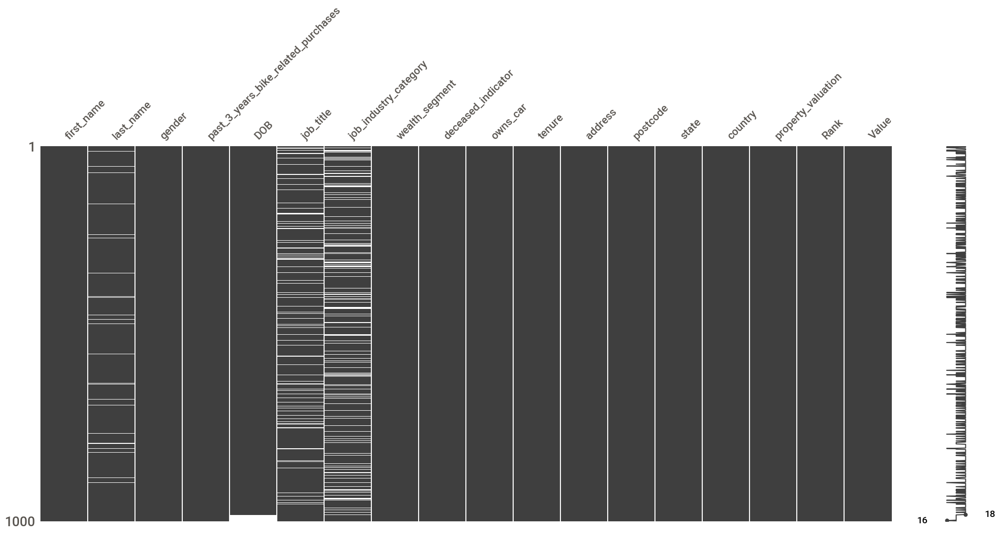

In [80]:
msno.matrix(df_newcustomers.sort_values(by=['DOB']))
plt.plot

In [14]:
df_newcustomers_clean = df_newcustomers.copy()

In [15]:
absent_data = ['job_title', 'job_industry_category', 'last_name']
df_newcustomers_clean[absent_data] = df_newcustomers_clean[absent_data].fillna('unspecified')
df_newcustomers_clean['last_name'].isna().sum()

0

In [16]:
df_newcustomers_clean = df_newcustomers_clean.dropna(subset = ['DOB'])

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

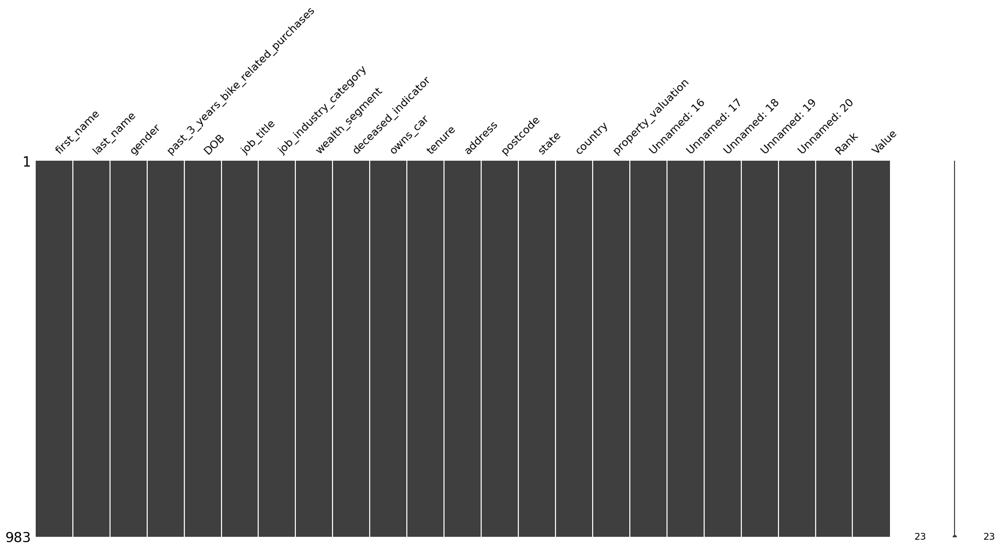

In [17]:
msno.matrix(df_newcustomers_clean.sort_values(by=['DOB']))
plt.plot

In [18]:
df_newcustomers_clean.columns

Index(['first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20', 'Rank', 'Value'],
      dtype='object')

In [19]:
df_customers['past_3_years_bike_related_purchases'].dtype

dtype('int64')

In [20]:
df_newcustomers_clean['Value'].value_counts()

0.637500    13
1.062500    12
0.892500     9
0.945625     9
1.237500     9
            ..
0.773500     1
0.605625     1
0.610938     1
0.770312     1
0.340000     1
Name: Value, Length: 324, dtype: int64

Report on New Customer table Data Quality Assessment:
* 1000 customers and don`t have any ID for them
* we don`t have DOB specified for 17 customers
* we have some columns with no names, but with some calculated values - removed

## 2.3. Demographic

In [62]:
df_demographic.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,<script>alert('hi')</script>,Yes,16.0
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,2018-02-01 00:00:00,Yes,15.0
3,4,Talbot,NaN,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,NIL,Yes,8.0


In [63]:
df_demographic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   customer_id                          4000 non-null   int64         
 1   first_name                           4000 non-null   object        
 2   last_name                            3875 non-null   object        
 3   gender                               4000 non-null   object        
 4   past_3_years_bike_related_purchases  4000 non-null   int64         
 5   DOB                                  3913 non-null   datetime64[ns]
 6   job_title                            3494 non-null   object        
 7   job_industry_category                3344 non-null   object        
 8   wealth_segment                       4000 non-null   object        
 9   deceased_indicator                   4000 non-null   object        
 10  default     

In [66]:
df_demographic['last_name'].isna().sum()

125

In [21]:
df_demographic[df_demographic['customer_id']==1]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0


<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

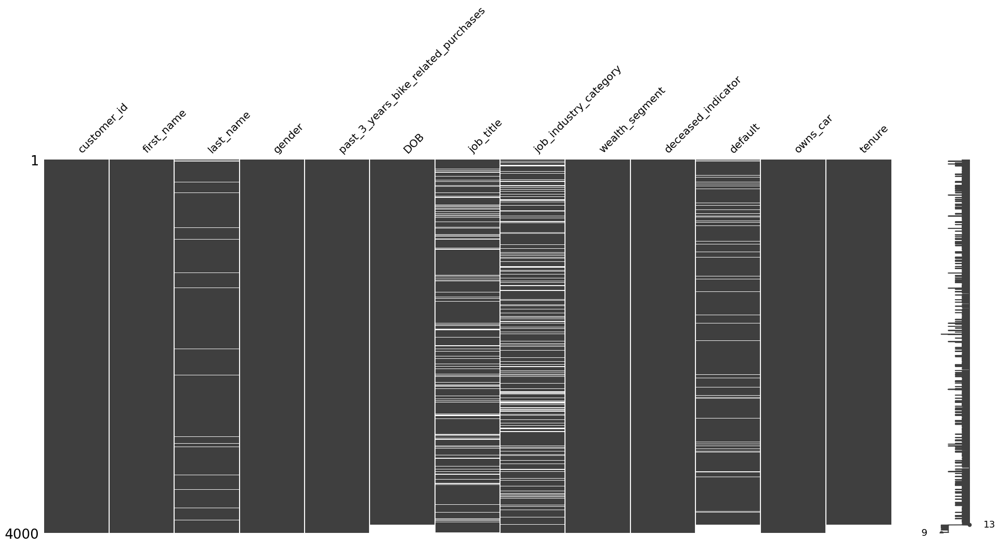

In [70]:
msno.matrix(df_demographic.sort_values(by=['DOB']))
plt.plot

In [22]:
df_demographic_clean = df_demographic.copy()

Gender represented by not allowable values, which I replaced with F/M/U

In [23]:
df_demographic_clean['gender'] = df_demographic_clean['gender'].replace(['Female', 'F', 'Femal'], 'F', regex=True)
df_demographic_clean['gender'] = df_demographic_clean['gender'].replace(['Male', 'M'], 'M', regex=True)

DOB doesn't match range constraint: its 1843-12-21 indicated. I removed everything before 1931 year and missing values (87 customers, for whom columns default and tenure also blanks) and 2 deceased customer also removed

In [24]:
df_demographic_clean = df_demographic_clean[(df_demographic_clean['DOB'] >= '1931')& (df_demographic_clean['deceased_indicator']=='N')]

In [25]:
df_demographic_clean['DOB'].max()

Timestamp('2002-03-11 00:00:00')

497 customers didn`t specify job_title and 656 customers didnt specify job_industry_category and 125 customers didnt specify last_name -> '*unspecified*'

In [26]:
df_demographic_clean['job_industry_category'].isna().sum()

656

In [27]:
blank_jobs_col = ['job_title','job_industry_category']
df_demographic_clean[blank_jobs_col] = df_demographic_clean[blank_jobs_col].fillna('unspecified')

In [28]:
df_demographic_clean['job_title'].isna().sum()

0

In [29]:
df_demographic_clean['tenure'].min()

1.0

In [30]:
df_demographic_clean.columns

Index(['customer_id', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'default', 'owns_car', 'tenure'],
      dtype='object')

default column is interpretable and thus removed

In [31]:
df_demographic_clean = df_demographic_clean.drop(['default'], axis=1)

In [32]:
blank_jobs_col = ['last_name', 'job_title', 'job_industry_category']
df_demographic_clean[blank_jobs_col] = df_demographic_clean[blank_jobs_col].fillna('unspecified')

In [33]:
df_demographic_clean['last_name'].isna().sum()

0

Report:
* 4000 distinct customers id in the dataset before cleaning
* no duplicated records
* Gender represented by not allowable values, which I replaced with F/M/U
* Missing data: 497 job_title, 656 job_industry_category, 125 last_name -> unspecified category
* DOB doesn't match range constraint: its 1843-12-21 indicated for 1 customer. I removed everything before 1931 year and missing values (87 customers, for whom columns default and tenure also blanks) and 2 deceased customer also removed
* default column is not interpretable, dropped

## 2.4. CustomerAddress

In [83]:
df_address.head()

,customer_id,address,postcode,state,country,property_valuation
0,1,060 Morning Avenue,2016,New South Wales,Australia,10
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10
2,4,0 Holy Cross Court,4211,QLD,Australia,9
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4
4,6,9 Oakridge Court,3216,VIC,Australia,9


In [84]:
df_address.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   customer_id         3999 non-null   int64 
 1   address             3999 non-null   object
 2   postcode            3999 non-null   int64 
 3   state               3999 non-null   object
 4   country             3999 non-null   object
 5   property_valuation  3999 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 187.6+ KB


In [34]:
def calculate_completion_percentage(df):
    total_cells = df.size
    missing_values = df.isnull().sum().sum()
    completion_percentage = 100 * (1 - missing_values / total_cells)
    return completion_percentage

calculate_completion_percentage(df_address)

100.0

In [35]:
df_address.duplicated().sum()

0

We should rename states New South Wales with existing spelling NSW and Victoria with VIC

In [36]:
df_address['state'].value_counts()

NSW                2054
VIC                 939
QLD                 838
New South Wales      86
Victoria             82
Name: state, dtype: int64

In [37]:
df_address_clean = df_address.copy()

In [38]:
states = {'New South Wales':'NSW',
          'Victoria':'VIC'}
df_address_clean['state'] = df_address_clean['state'].replace(states)

In [39]:
df_address_clean

,customer_id,address,postcode,state,country,property_valuation
0,1,060 Morning Avenue,2016,NSW,Australia,10
1,2,6 Meadow Vale Court,2153,NSW,Australia,10
2,4,0 Holy Cross Court,4211,QLD,Australia,9
3,5,17979 Del Mar Point,2448,NSW,Australia,4
4,6,9 Oakridge Court,3216,VIC,Australia,9
...,...,...,...,...,...,...
3994,3999,1482 Hauk Trail,3064,VIC,Australia,3
3995,4000,57042 Village Green Point,4511,QLD,Australia,6
3996,4001,87 Crescent Oaks Alley,2756,NSW,Australia,10
3997,4002,8194 Lien Street,4032,QLD,Australia,7


In [40]:
df_address_clean['state'].value_counts()

NSW    2140
VIC    1021
QLD     838
Name: state, dtype: int64

Merging datasets with Customer ID

In [41]:
df_merged = pd.merge(df_demographic_clean, df_address_clean, on='customer_id')
len(df_merged)

3906

In [42]:
df_merged = pd.merge(df_demographic, df_address, on='customer_id')
len(df_merged)

3996

In [43]:
df_demo_miss = df_demographic[~df_demographic['customer_id'].isin(df_address['customer_id'])]
df_address_miss = df_address[~df_address['customer_id'].isin(df_demographic['customer_id'])]
df_both_miss = pd.concat([df_demo_miss['customer_id'],
                          df_address_miss['customer_id']])
df_both_miss.unique()

array([   3,   10,   22,   23, 4001, 4002, 4003])

In [44]:
df_address_miss = df_address[~df_address['customer_id'].isin(df_demographic['customer_id'])]
df_address_miss

,customer_id,address,postcode,state,country,property_valuation
3996,4001,87 Crescent Oaks Alley,2756,NSW,Australia,10
3997,4002,8194 Lien Street,4032,QLD,Australia,7
3998,4003,320 Acker Drive,2251,NSW,Australia,7


Report on Castomer address table Data Quality Assessment:

* There are 3999 customers with adderesses
* No duplicates
* no missing values
* renamed states New South Wales with existing spelling NSW and Victoria with VIC
* Comparing 2 datasets with customer_id we don`t have the following customer ID in address table: 3, 10,22,23, and the following in demographic table: 4001, 4002, 4003.
* lack of context on property_valuation column


## 2.5. Report on Data Quality Assessment


**Transaction Table:**

*   The initial dataset contained 20,000 transactions from the year 2017.
*   No duplicate transactions were found, but missing values were present.
*   There are 101 distinct products, 6 brands with different attributes.
*   3,494 distinct customers were identified.
*   Some records lack clarity regarding product_first_sold_date.
*   358 records (2% of transactions) had unspecified online_status, which was filled as 'unspecified' for analysis.
*   197 records (1% of transactions) with missing product attributes were removed.
*   No column for quantity sold was observed.

**New Customer Table:**

*   The table includes 1,000 customers without assigned IDs.
*   17 customers lack specified dates of birth (DOB).
*   Columns without names containing calculated values were removed.

**Customers Demographic Table:**



*   Initially, 4,000 distinct customer IDs were present.
*   No duplicated records were found.
*   Gender values were replaced with F/M/U.
*   Missing data in job-related columns (job_title, job_industry_category, last_name) was filled with 'unspecified'.
*   DOB values before 1931 and inconsistent values were removed.
*   The unclear 'default' column was dropped.

**Customer Address Table:**

*   Addresses are available for 3,999 customers.
*   No duplicate records were identified.
*   No missing values were present.
*   State names were standardized (New South Wales to NSW, Victoria to VIC).
*   Differences in customer IDs between tables were noted (e.g., missing IDs: 3, 10, 22, 23, 4001, 4002, 4003).
*   The context of the property_valuation column is unclear.

# 3. Data Insights

## 3.1. Data Preparation

In [57]:
# Transactions table preparation
cond_1 = df_transactions_clean['order_status'] != 'Cancelled'
cond_2 = df_transactions_clean['online_order_cleaned'] != 'unspecified'
df_transactions_model = df_transactions_clean[(cond_1) & cond_2]
# Calculating profit
df_transactions_model['profit'] = df_transactions_model['list_price'] - df_transactions_model['standard_cost']
df_transactions_model.head()

<ipython-input-57-0d99b22f76cf>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_transactions_model['profit'] = df_transactions_model['list_price'] - df_transactions_model['standard_cost']


,transaction_id,product_id,customer_id,transaction_date,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date_clean,online_order_cleaned,profit
0,1,2,2950,2017-02-25,Approved,Solex,Standard,medium,medium,71.49,53.62,2012-12-02,0.0,17.87
1,2,3,3120,2017-05-21,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,2014-03-03,1.0,1702.55
2,3,37,402,2017-10-16,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,1999-07-20,0.0,1544.61
3,4,88,3135,2017-08-31,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,1998-12-16,0.0,817.36
4,5,78,787,2017-10-01,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,2015-08-10,1.0,1055.82


In [58]:
# creating Age bins
def age(born):
    today = date.today()
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))

In [59]:
# newcustomers table preparation
df_newcustomers_model = df_newcustomers_clean[~df_newcustomers_clean[['job_title', 'job_industry_category']].isin(['unspecified']).any(axis=1)]
# changing format for gender field
gender_replace = {'Male':'M', 'Female':'F'}
df_newcustomers_model.loc[:,'gender'] = df_newcustomers_clean['gender'].replace(gender_replace)
# Calculating customers Age
df_newcustomers_model['age'] = df_newcustomers_model['DOB'].apply(age)
df_newcustomers_model.head()
# Age bins
bins = [0,10,20,30,40,50,60,70,80,90,100]
df_newcustomers_model['age_group'] = pd.cut(df_newcustomers_model['age'], bins=bins)

<ipython-input-59-861632d7db20>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_newcustomers_model.loc[:,'gender'] = df_newcustomers_clean['gender'].replace(gender_replace)
<ipython-input-59-861632d7db20>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_newcustomers_model['age'] = df_newcustomers_model['DOB'].apply(age)
<ipython-input-59-861632d7db20>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [60]:
# demographic table preparation
df_demographic_model = df_demographic_clean[~df_demographic_clean[['job_title', 'job_industry_category']].isin(['unspecified']).any(axis=1)]
df_demographic_model.head()
# Calculating customers Age
df_demographic_model['age'] = df_demographic_model['DOB'].apply(age)
df_demographic_model

<ipython-input-60-3ad698083489>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_demographic_model['age'] = df_demographic_model['DOB'].apply(age)


,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,age
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69
1,2,Eli,Bockman,M,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,Yes,16.0,42
2,3,Arlin,Dearle,M,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,Yes,15.0,69
8,9,Mala,Lind,F,97,1973-03-10,Business Systems Development Analyst,Argiculture,Affluent Customer,N,Yes,8.0,50
9,10,Fiorenze,Birdall,F,49,1988-10-11,Senior Quality Engineer,Financial Services,Mass Customer,N,Yes,20.0,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3992,3993,Andi,Dumelow,F,6,1974-12-05,Librarian,Entertainment,Mass Customer,N,No,10.0,48
3993,3994,Stephie,Byars,F,5,1989-04-07,Structural Analysis Engineer,Manufacturing,Affluent Customer,N,No,12.0,34
3994,3995,Rusty,Iapico,M,93,1975-12-12,Staff Scientist,Manufacturing,Mass Customer,N,Yes,14.0,47
3995,3996,Rosalia,Halgarth,F,8,1975-08-09,VP Product Management,Health,Mass Customer,N,No,19.0,48


In [61]:
# CustomerAddress table preparation
df_address_model = df_address_clean.copy()

In [62]:
# merging 3 datasets
df_model = pd.merge(df_transactions_model,df_demographic_model, on='customer_id').merge(df_address_model, on='customer_id')

bins = [0,10,20,30,40,50,60,70,80,90,100]
df_model['age_group'] = pd.cut(df_model['age'], bins=bins)

len(df_model['customer_id'].unique())

2519

In [63]:
df_model.to_csv('/content/drive/MyDrive/Colab Notebooks/KPMG/df_model.csv', index=False)

## 3.2. EDA with pygwalker

In [4]:
df_model = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/KPMG/df_model.csv')

In [5]:
!pip install pygwalker
import pygwalker as pyg

In [64]:
# Current customers
pyg.walk(df_model, dark='light')

Box(children=(HTML(value='<div id="ifr-pyg-0" style="height: auto">\n    <head>\n        <meta http-equiv="Con…

In [111]:
# Comparison with New customers
pyg.walk(df_newcustomers_model, dark='light')

Box(children=(HTML(value='<div id="ifr-pyg-3" style="height: auto">\n    <head>\n        <meta http-equiv="Con…

## 3.3. Comparing customers with sweetviz

In [ ]:
!pip install sweetviz
import sweetviz as sv

In [72]:
df_newcustomers_model.columns

Index(['first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20', 'Rank', 'Value', 'age', 'age_group'],
      dtype='object')

In [74]:
df_model.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'order_status', 'brand', 'product_line', 'product_class',
       'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date_clean', 'online_order_cleaned', 'profit',
       'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'age', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'age_group'],
      dtype='object')

In [ ]:
compare_fields = ['gender', 'age_group', 'state', 'past_3_years_bike_related_purchases', 'job_industry_category', 'wealth_segment', 'owns_car', 'tenure', 'property_valuation']
compare_report = sv.compare([df_model[compare_fields], 'Current Customers'], [df_newcustomers_model[compare_fields], 'New Customers'])
compare_report.show_html('compare.html', open_browser = False)


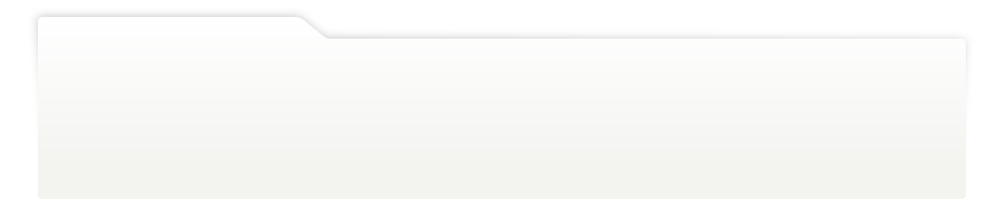
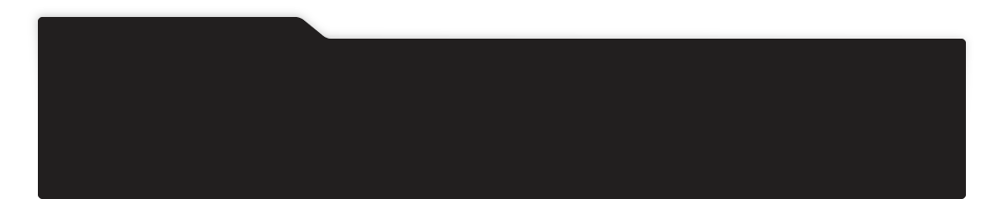
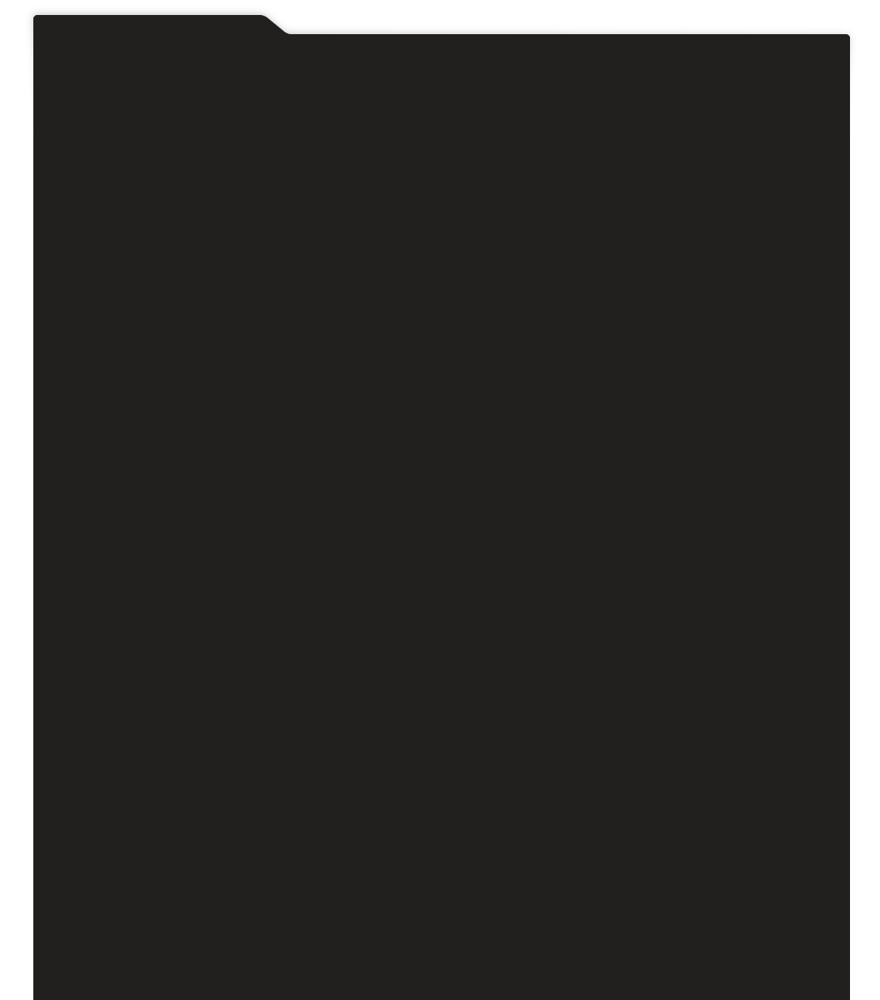
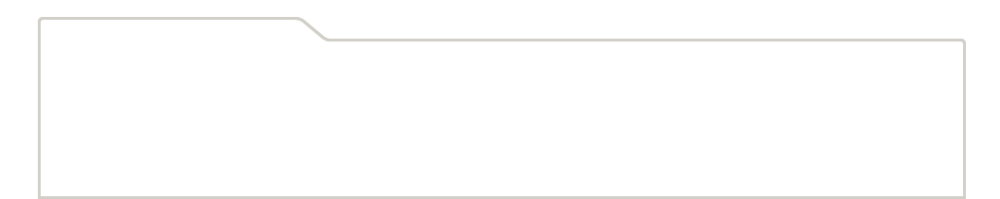
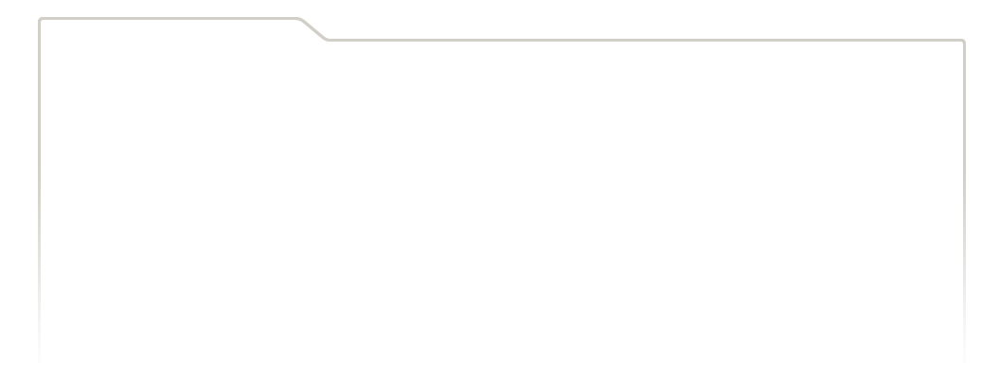
...
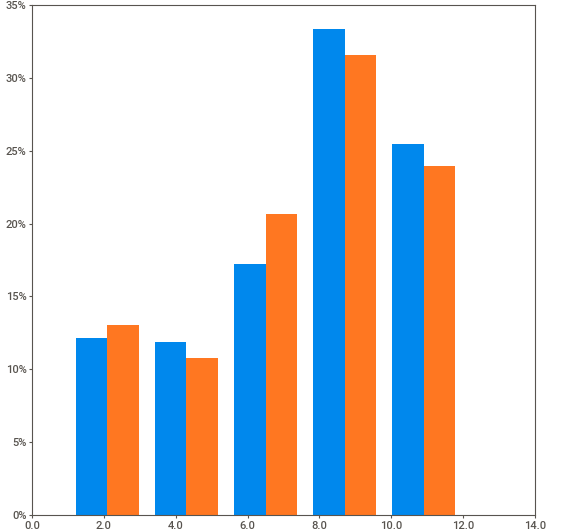
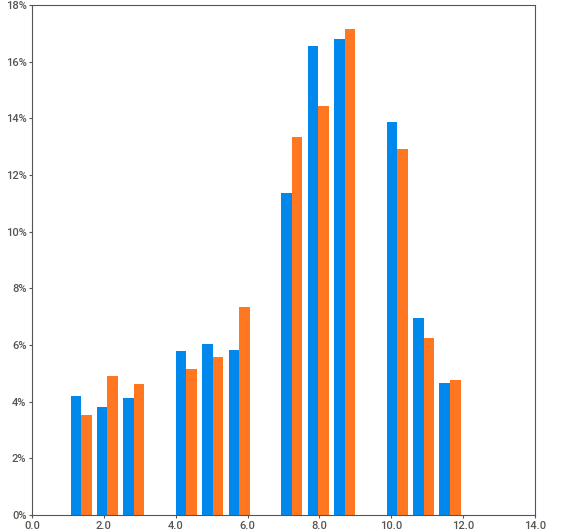
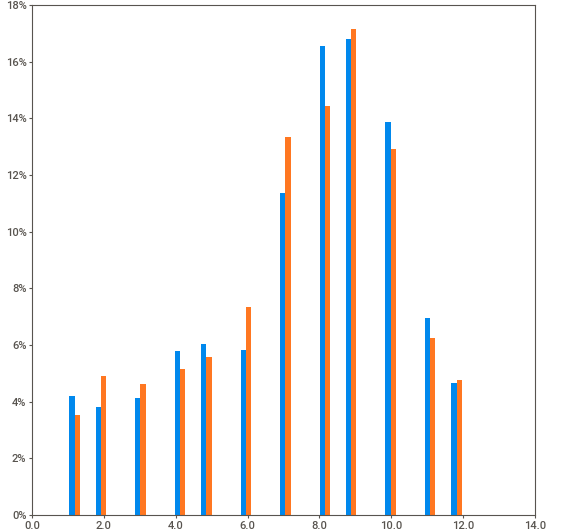
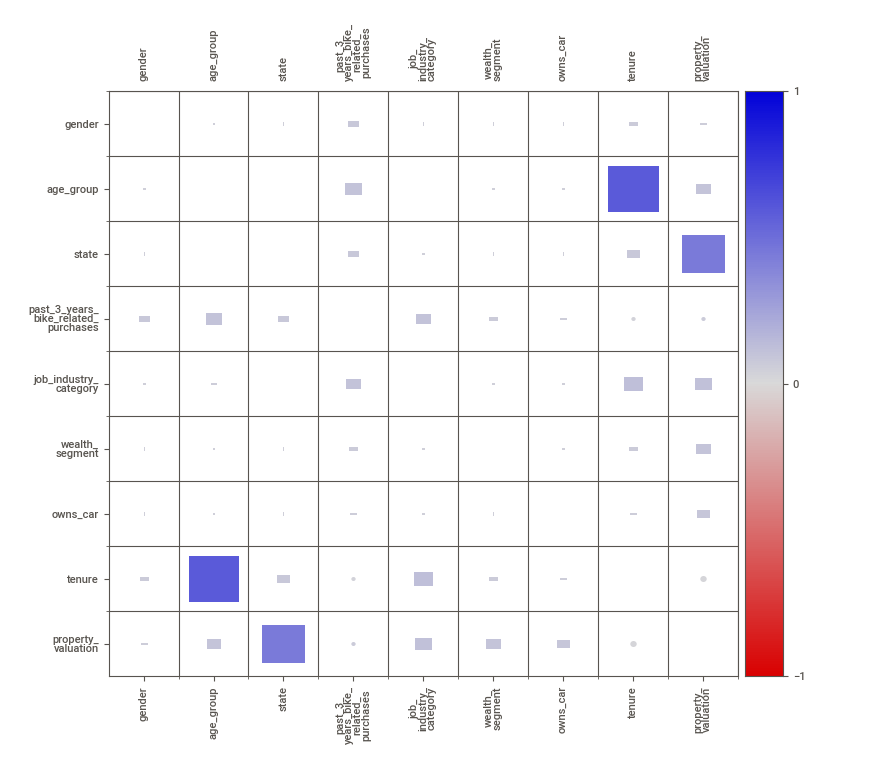
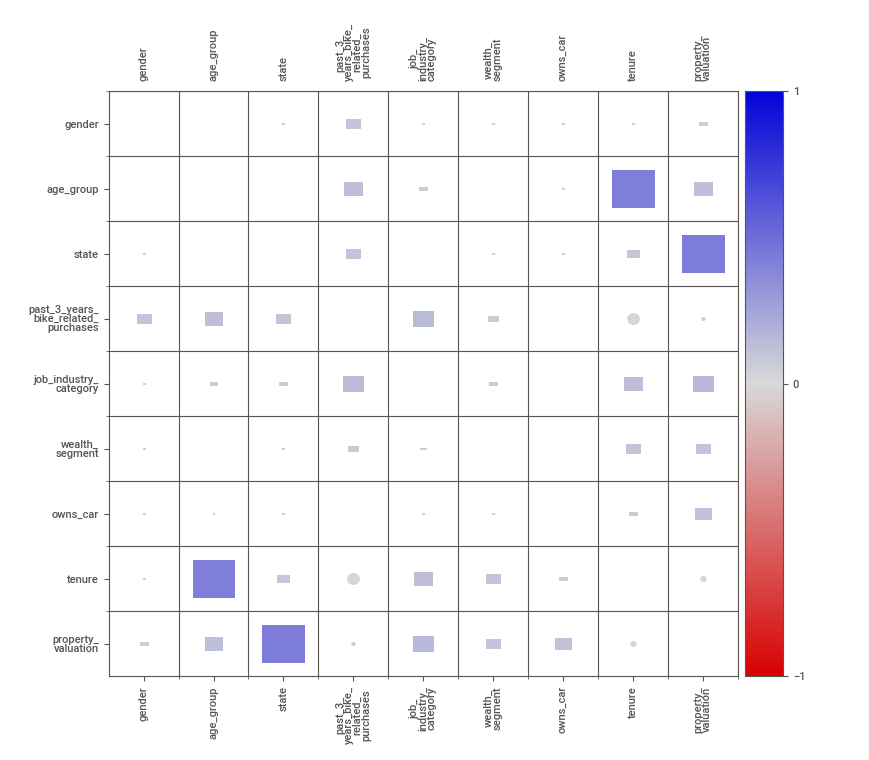

In [82]:
import IPython
IPython.display.HTML('compare.html')

## RFM Analysis

In [5]:
df_model = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/KPMG/df_model.csv')
df_model.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'order_status', 'brand', 'product_line', 'product_class',
       'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date_clean', 'online_order_cleaned', 'profit',
       'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'age', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'age_group'],
      dtype='object')

In [6]:
customers_nmb = len(df_model['customer_id'].unique())
print('# of customers:', customers_nmb)
df_shape = df_model.shape
print('df shape:', df_shape)

# of customers: 2519
df shape: (13910, 32)


In [7]:
# adding column for recency as diff between recent day and transaction_day
recent_day = pd.to_datetime(df_model['transaction_date'].max())
df_model['recency'] = (recent_day -  pd.to_datetime(df_model['transaction_date'])).dt.days
df_model[['transaction_date', 'recency']].head()

,transaction_date,recency
0,2017-02-25,308
1,2017-10-16,75
2,2017-04-26,248
3,2017-05-21,223
4,2017-10-05,86


In [8]:
# creating rfm dataframe
columns = ['recency', 'transaction_id', 'profit']
calc = {'recency': 'min', 'transaction_id': 'count', 'profit': 'sum'}
fields_name = {'recency': 'recency', 'transaction_id': 'frequency', 'profit': 'monetary'}
df_rfm = df_model.pivot_table(index = 'customer_id', values = columns, aggfunc = calc).rename(columns = fields_name)
df_rfm.head()

,monetary,recency,frequency
customer_id,,,
1,3018.09,7,11
2,2226.26,128,3
9,2353.11,78,6
12,3540.03,67,7
13,4337.38,27,7


In [9]:
# calculating statistics for each column
r_stat = {
    'min': df_rfm['recency'].min(),
    'low_quartile': np.percentile(df_rfm['recency'], 25),
    'median': np.median(df_rfm['recency']),
    'high_quartile': np.percentile(df_rfm['recency'], 75),
    'max': df_rfm['recency'].max()
}

f_stat = {
    'min': df_rfm['frequency'].min(),
    'low_quartile': np.percentile(df_rfm['frequency'], 25),
    'median': np.median(df_rfm['frequency']),
    'high_quartile': np.percentile(df_rfm['frequency'], 75),
    'max': df_rfm['frequency'].max()
}

m_stat = {
    'min': df_rfm['monetary'].min(),
    'low_quartile': np.percentile(df_rfm['monetary'], 25),
    'median': np.median(df_rfm['monetary']),
    'high_quartile': np.percentile(df_rfm['monetary'], 75),
    'max': df_rfm['monetary'].max()
}
m_stat

{'min': 15.080000000000004,
 'low_quartile': 1766.355,
 'median': 2785.0400000000004,
 'high_quartile': 4063.625,
 'max': 11668.949999999999}

In [10]:
# function to calculate score_field
def calculate_score(column, stats):
  return np.where(column <= stats['low_quartile'], 4,
                               np.where(column <= stats['median'], 3,
                                        np.where(column <= stats['high_quartile'], 2, 1)))

In [11]:
# adding score columns
df_rfm['r_score'] = calculate_score(df_rfm['recency'], r_stat)
df_rfm['f_score'] = calculate_score(df_rfm['frequency'], f_stat)
df_rfm['m_score'] = calculate_score(df_rfm['monetary'], m_stat)

In [12]:
# creating Customer`s profile
df_rfm['rfm_profile'] = (df_rfm['r_score'].astype(str)+df_rfm['f_score'].astype(str)+df_rfm['m_score'].astype(str)).astype(int)

In [13]:
# Define a function to determine the category
def determine_category(rfm):
    if rfm >= 411:
        return 'Platinum'
    elif rfm >= 311:
        return 'Gold'
    elif rfm >= 211:
        return 'Silver'
    else:
        return 'Bronze'

# Apply the function to create the 'Category' column
df_rfm['customer_category'] = df_rfm.apply(lambda row: determine_category(row['rfm_profile']), axis=1)
df_rfm['customer_category'].value_counts()

Platinum    639
Gold        630
Bronze      628
Silver      622
Name: customer_category, dtype: int64

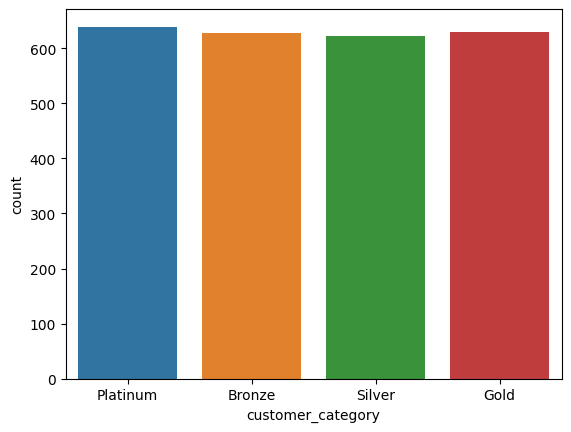

In [15]:
sns.countplot(x = 'customer_category',
             data = df_rfm)
            #  hue = 'location',)
plt.show()

In [174]:
# creating RFM matrix
df_rfm_heat = df_rfm.pivot_table(index=['r_score', 'f_score'], columns='m_score', values='monetary', aggfunc='count', fill_value=0)
df_rfm_heat = df_rfm_heat.sort_index(ascending=[False, False])
df_rfm_heat = df_rfm_heat.sort_index(axis=1, ascending=False)
df_rfm_heat.head()

m_score           4   3   2    1
r_score f_score                 
4       4        75  45  27    7
        3        16  43  33   14
        2        21  60  65   59
        1         0  14  43  117
3       4        86  52  24    3

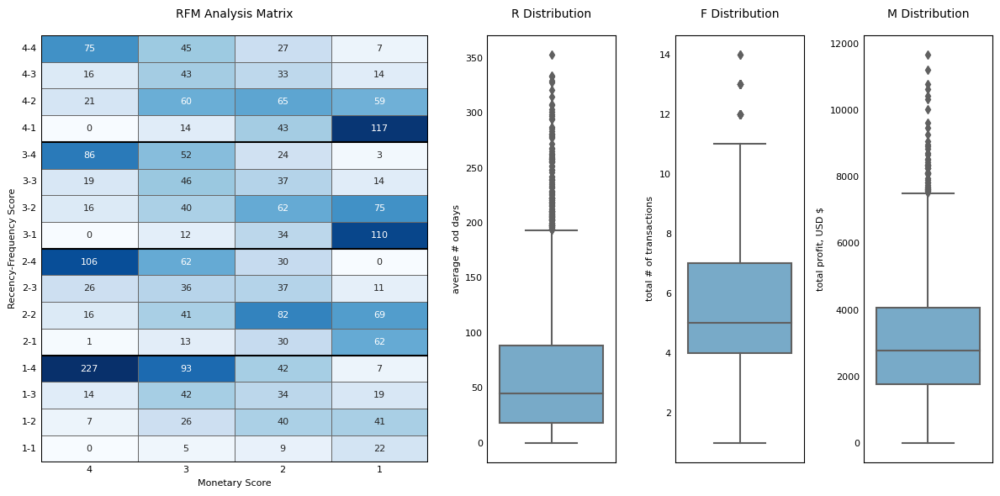

In [ ]:
# Create RFM visualization

fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(1, 4, width_ratios=[3, 1, 1,1])

# Create a heatmap using seaborn with conditional formatting
ax1 = plt.subplot(gs[0])
sns.heatmap(df_rfm_heat,
            vmin=0, vmax=120,
            annot=True,
            cmap='Blues',
            fmt='d',
            annot_kws={'size': 8},
            linewidths=.5, linecolor='dimgrey',
            cbar=False, ax=ax1)
ax1.set_title('RFM Analysis Matrix', fontsize=10, color='black', pad=15)
ax1.set_xlabel('Monetary Score', fontsize=8)
ax1.set_ylabel('Recency-Frequency Score', fontsize=8)
ax1.tick_params(axis='both', which='both', length=0, rotation=0, labelsize=8)

# add frame around the heatmap
ax1.axvline(x = 4, color = "k")
ax1.axvline(x = 0, color = "k")
ax1.axhline(y = 16, color = "k")
ax1.axhline(y = 0, color = "k")

# add lines to separate Recency sections
ax1.axhline(y = 12, color = "k")
ax1.axhline(y = 8, color = "k")
ax1.axhline(y = 4, color = "k")

# Plot for Recency
ax2 = plt.subplot(gs[1])
sns.boxplot(y ='recency', data = df_rfm, palette='Blues', ax=ax2)
ax2.set_title('R Distribution', fontsize=10, color='black', pad=15)
ax2.set_ylabel('average # od days',fontsize=8)
ax2.tick_params(axis='both', which='both', length=0, rotation=0, labelsize=8)

# Plot for Frequency
ax3 = plt.subplot(gs[2])
sns.boxplot(y='frequency', data=df_rfm, palette='Blues', ax=ax3)
ax3.set_title('F Distribution', fontsize=10, color='black', pad=15)
ax3.set_ylabel('total # of transactions',fontsize=8)
ax3.tick_params(axis='both', which='both', length=0, rotation=0, labelsize=8)

# Plot for Monetary
ax4 = plt.subplot(gs[3])
sns.boxplot(y='monetary', data=df_rfm, palette='Blues', ax=ax4)
ax4.set_title('M Distribution', fontsize=10, color='black', pad=15)
ax4.set_ylabel('total profit, USD $',fontsize=8)
ax4.tick_params(axis='both', which='both', length=0, rotation=0, labelsize=8)

# Adjust layout
plt.tight_layout()
plt.show()

## Cohort Retention Analysis

In [26]:
# data for cohorts
df_transactions_clean.head()
cond_1 = df_transactions_clean['order_status']!='Cancelled'
df_cohort = df_transactions_clean[cond_1].copy()

In [27]:
df_cohort = df_cohort[['customer_id', 'transaction_date']]
df_cohort['transaction_month'] = pd.to_datetime(df_cohort['transaction_date']).dt.month
df_cohort['nmb_months_diff'] = df_cohort['transaction_month'] - df_cohort['transaction_month'].min()
df_cohort.head()

,customer_id,transaction_date,transaction_month,nmb_months_diff
0,2950,2017-02-25,2,1
1,3120,2017-05-21,5,4
2,402,2017-10-16,10,9
3,3135,2017-08-31,8,7
4,787,2017-10-01,10,9


In [28]:
df_cohort_month = df_cohort.groupby('customer_id')['nmb_months_diff'].min().reset_index()
df_cohort_month.rename(columns={'nmb_months_diff':'cohort'}, inplace = True)
df_cohort_month.head()

,customer_id,cohort
0,1,0
1,2,4
2,3,1
3,4,3
4,5,2


In [29]:
# joining all transactions and first month transaction
df_cohort_retention = df_cohort.join(df_cohort_month.set_index('customer_id'), on = 'customer_id')
df_cohort_retention['month_nmb'] = df_cohort_retention['nmb_months_diff']-df_cohort_retention['cohort']
df_cohort_retention_clean = df_cohort_retention[['customer_id', 'cohort', 'month_nmb']].copy()
df_cohort_retention_clean=df_cohort_retention_clean.drop_duplicates(subset = ['customer_id', 'cohort', 'month_nmb'], keep = 'first')
df_cohort_retention_clean.sort_values(by='customer_id')

,customer_id,cohort,month_nmb
93,1,0,11
14485,1,0,2
9784,1,0,0
15662,1,0,5
3764,1,0,3
...,...,...,...
2462,3500,0,3
8415,3500,0,1
19835,3500,0,2
8707,5034,0,9


In [30]:
# calculating # of customers for each cohort and month_nmb
df_retention = df_cohort_retention_clean.groupby(['cohort', 'month_nmb'])['customer_id'].count().reset_index()
df_retention = df_retention.pivot_table(values = 'customer_id', columns = 'month_nmb', index = 'cohort')

In [31]:
# calculating rates
df_retention = df_retention.divide(df_retention.iloc[:,0], axis=0).round(3)*100
df_retention = df_retention.iloc[:,1:]
df_retention

month_nmb,1,2,3,4,5,6,7,8,9,10,11
cohort,,,,,,,,,,,
0,35.8,37.0,36.4,36.0,35.1,37.6,38.7,36.0,38.4,36.4,37.5
1,39.7,36.9,38.9,35.2,37.0,38.2,35.0,40.5,37.4,36.2,NaN
2,34.6,35.2,33.3,37.3,37.3,35.0,42.4,38.5,37.9,NaN,NaN
3,32.7,35.6,45.5,42.3,34.7,42.3,36.7,37.9,NaN,NaN,NaN
4,40.2,37.9,40.7,35.0,33.6,35.0,38.8,NaN,NaN,NaN,NaN
5,36.0,36.8,39.2,36.8,36.0,42.4,NaN,NaN,NaN,NaN,NaN
6,34.6,32.1,42.3,47.4,30.8,NaN,NaN,NaN,NaN,NaN,NaN
7,33.3,43.1,35.3,25.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,33.3,29.2,37.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


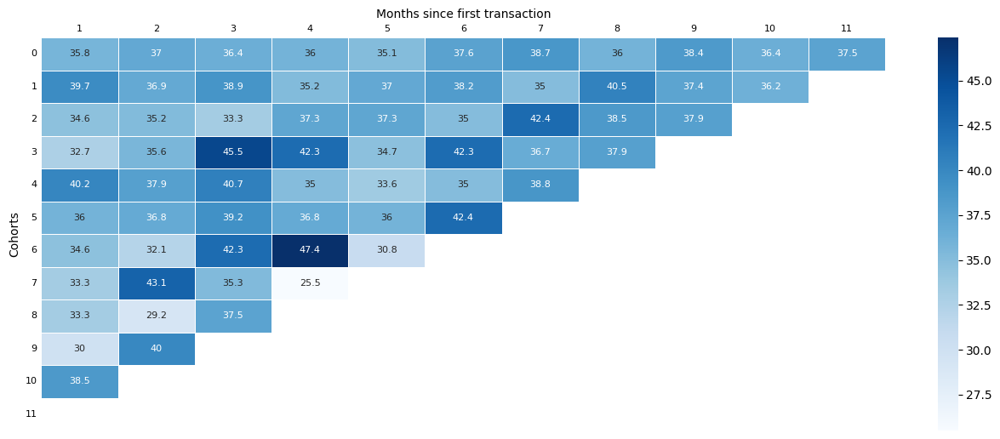

In [32]:
# creating a heatmap
fig, ax = plt.subplots(1,1,figsize=(16,6))
sns.heatmap(df_retention, annot=True, cmap='Blues',annot_kws={'size': 8},fmt='g',linewidths=.5)

ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.xaxis.set_label_coords(0.5, 1.05)

ax.set_xlabel('Months since first transaction')
ax.set_ylabel('Cohorts')
ax.tick_params(axis='both', which='both', length=0, rotation=0, labelsize=8)

# Reverse the order of x-axis labels
xticks = ax.get_xticks()
ax.set_xticks(xticks[::-1])
ax.set_xticklabels(df_retention.columns[::-1])

plt.show()

## Time-Series Analysis

In [100]:
df_model.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'order_status', 'brand', 'product_line', 'product_class',
       'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date_clean', 'online_order_cleaned', 'profit',
       'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'age', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'age_group', 'recency'],
      dtype='object')

In [129]:
aggregation = {'transaction_id': 'count',
               'customer_id': 'nunique',
               'list_price': 'sum',
               'profit': 'sum',
               }
df_model_trends = df_model.copy()
df_model_trends['transaction_month'] = pd.to_datetime(df_model_trends['transaction_date']).dt.strftime('%Y-%m')
df_model_trends = df_model_trends.groupby('transaction_month')[['transaction_id','customer_id', 'list_price', 'profit']].agg(aggregation).reset_index()
df_model_trends.rename(columns={'transaction_id':'nmb_transactions', 'customer_id':'nmb_customers', 'list_price': 'sum_sales', 'profit': 'sum_profit'}, inplace = True)
df_model_trends['sum_sales'] = df_model_trends['sum_sales']/1000000
df_model_trends['sum_profit'] = df_model_trends['sum_profit']/1000000
df_model_trends

,transaction_month,nmb_transactions,nmb_customers,sum_sales,sum_profit
0,2017-01,1160,947,1.286046,0.639429
1,2017-02,1162,929,1.293947,0.630157
2,2017-03,1163,931,1.291607,0.634696
3,2017-04,1172,932,1.317150,0.655239
4,2017-05,1186,929,1.343779,0.654765
5,2017-06,1079,883,1.204275,0.600365
6,2017-07,1149,926,1.272004,0.632699
7,2017-08,1206,957,1.334010,0.672973
8,2017-09,1086,877,1.203355,0.593783
9,2017-10,1225,967,1.373976,0.685697


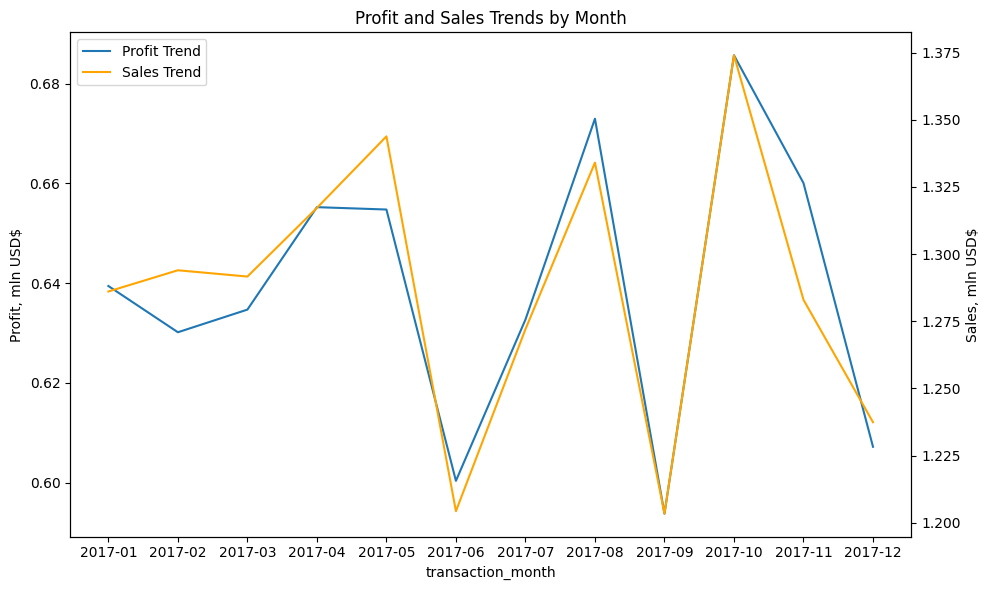

In [141]:
# Create the line chart
plt.figure(figsize=(10, 6))

# Plot the profit trend
ax1 = sns.lineplot(data=df_model_trends, x='transaction_month', y='sum_profit', errorbar=None, label='Profit Trend')

# Create a twin Axes sharing the xaxis for sales trend
ax2 = ax1.twinx()
sns.lineplot(data=df_model_trends, x='transaction_month', y='sum_sales', errorbar=None, ax=ax2, color='orange', label='Sales Trend')

# Set labels and titles
ax1.set_title('Profit and Sales Trends by Month')
ax1.set_ylabel('Profit, mln USD$')
ax2.set_ylabel('Sales, mln USD$')

# Show legend for both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')
ax1.legend().set_visible(False)

plt.xticks(rotation=45)
plt.tight_layout()

# Display the chart
plt.show()

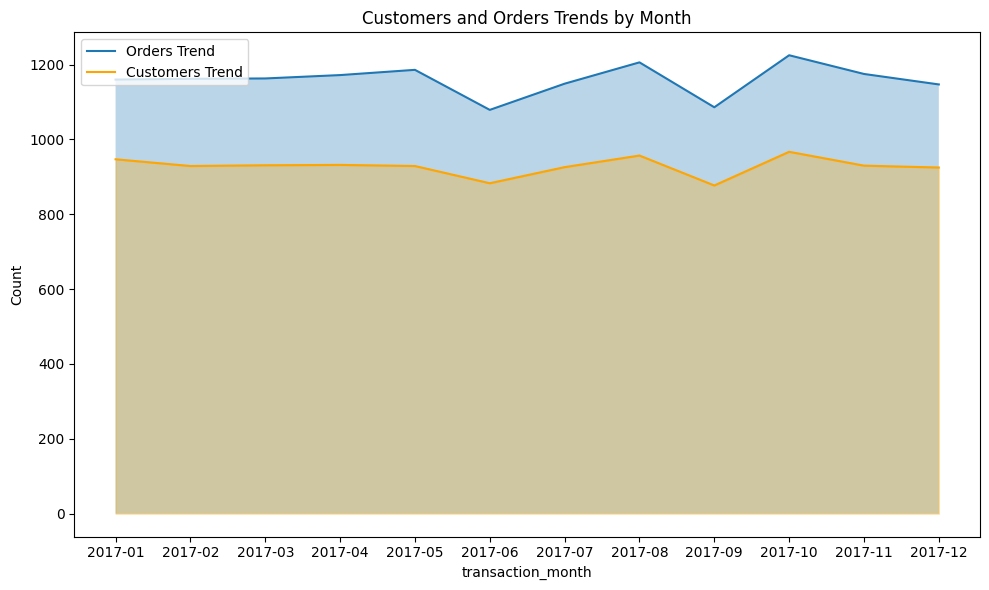

In [147]:
# Create the area chart
plt.figure(figsize=(10, 6))

# Plot the trends for number of customers and orders as area chart
sns.lineplot(data=df_model_trends, x='transaction_month', y='nmb_transactions', errorbar=None, label='Orders Trend')
sns.lineplot(data=df_model_trends, x='transaction_month', y='nmb_customers', errorbar=None, color='orange', label='Customers Trend')

# Fill the area
plt.fill_between(df_model_trends['transaction_month'], df_model_trends['nmb_transactions'], alpha=0.3)
plt.fill_between(df_model_trends['transaction_month'], df_model_trends['nmb_customers'], alpha=0.3, color='orange')

# Set labels and title
plt.title('Customers and Orders Trends by Month')
plt.ylabel('Count')

# Show legend
plt.legend(loc='upper left')

plt.xticks(rotation=0)
plt.tight_layout()

# Display the chart
plt.show()

## Visuals

In [191]:
pyg.walk(df_dim_customers, dark='light')

Box(children=(HTML(value='<div id="ifr-pyg-9" style="height: auto">\n    <head>\n        <meta http-equiv="Con…